In [2]:
import torch
from torch import nn
from tqdm import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

## TRICK

### get tensor value

In [3]:
x = torch.randn(1)
a = torch.randn(1)
y = a*x
y_value = y.item()
y_value

-0.45217278599739075

### detach()

In [19]:
## ONLY TRAIN DISCRIMINATOR, NOT GENERATOR

def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    
    ##! detach !##
    
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    
    return disc_loss

### Check weight.grad and check weights changed

In [ ]:
# Check that they detached correctly
assert gen.gen[0][0].weight.grad is None

# Update optimizer
old_weight = disc.disc[0][0].weight.data.clone()
disc_opt.step()
new_weight = disc.disc[0][0].weight.data
        
# Check that some discriminator weights changed
assert not torch.all(torch.eq(old_weight, new_weight))

In [ ]:
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05 # WHY 0.68

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

## Tools

In [21]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## Build the BASIC GAN with MNIST

## Generator

In [3]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

In [4]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8, im_dim, bias=True),
            nn.Sigmoid(),
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

## Verify the generator class

In [5]:
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise

In [6]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    input =(n_samples,z_dim)
    return torch.randn(input, device=device)

## Discriminator

In [7]:
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(negative_slope=0.2, inplace=True),
    )

In [8]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1),
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

## Verify the discriminator class

In [9]:
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Make sure there's no sigmoid
    assert test_input.max() > 1
    assert test_input.min() < -1

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training

In [10]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

In [11]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [12]:
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    
    ##! detach !##
    
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    
    return disc_loss

In [13]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05 # WHY 0.68

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [14]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
   
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))

    return gen_loss

In [15]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


  6%|▌         | 28/469 [00:00<00:11, 39.76it/s]

Epoch 1, step 500: Generator loss: 1.4439863957166672, discriminator loss: 0.4281025599241255


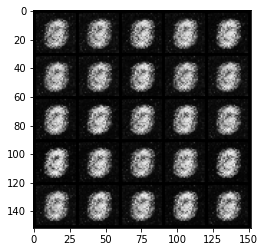

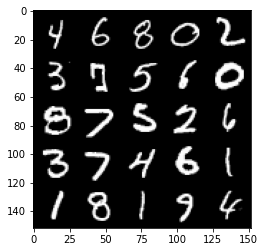

 13%|█▎        | 60/469 [00:01<00:10, 39.69it/s]

Epoch 2, step 1000: Generator loss: 1.79497980093956, discriminator loss: 0.2772593209445477


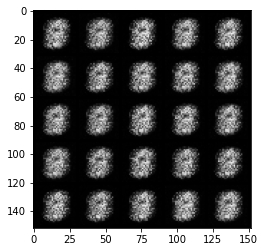

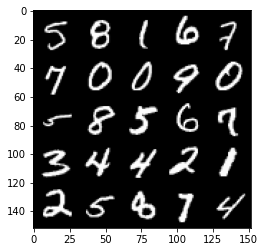

 20%|█▉        | 93/469 [00:02<00:09, 39.73it/s]

Epoch 3, step 1500: Generator loss: 2.133872527122497, discriminator loss: 0.1557203993499277


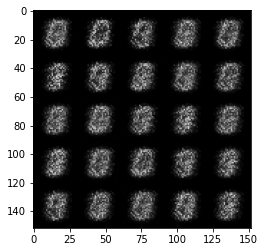

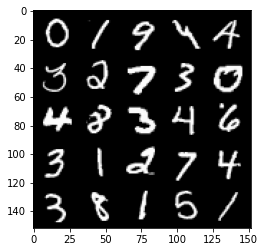

 26%|██▋       | 124/469 [00:03<00:08, 39.62it/s]

Epoch 4, step 2000: Generator loss: 1.7558053905963906, discriminator loss: 0.2213601740598679


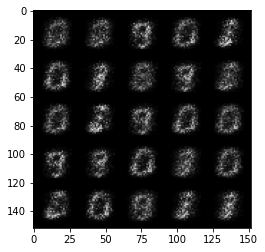

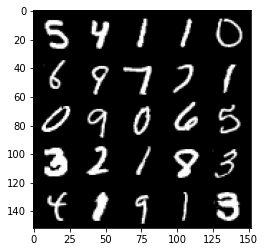

 32%|███▏      | 152/469 [00:03<00:08, 39.48it/s]

Epoch 5, step 2500: Generator loss: 1.6439169387817383, discriminator loss: 0.21790062528848653


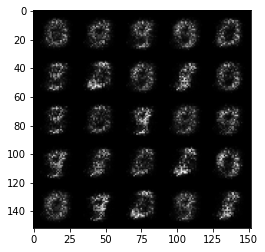

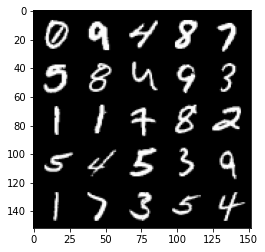

 39%|███▉      | 184/469 [00:04<00:07, 39.66it/s]

Epoch 6, step 3000: Generator loss: 1.8772519471645335, discriminator loss: 0.1803669478297233


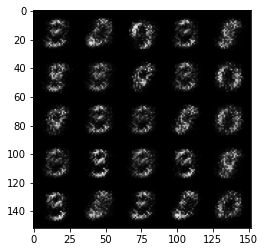

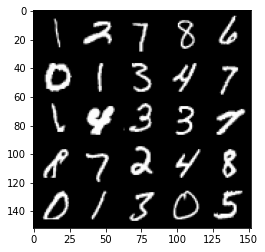

 46%|████▌     | 216/469 [00:05<00:06, 39.44it/s]

Epoch 7, step 3500: Generator loss: 2.227474018096921, discriminator loss: 0.15608017462491977


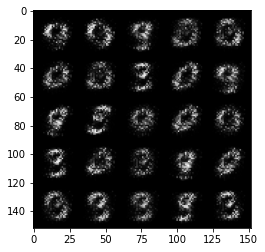

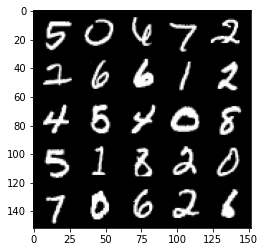

 53%|█████▎    | 248/469 [00:06<00:05, 39.46it/s]

Epoch 8, step 4000: Generator loss: 2.6174193058013957, discriminator loss: 0.1263556204140185


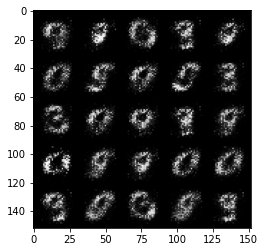

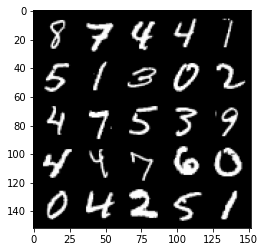

 59%|█████▉    | 276/469 [00:06<00:04, 39.57it/s]

Epoch 9, step 4500: Generator loss: 3.0294370298385602, discriminator loss: 0.09811169337481261


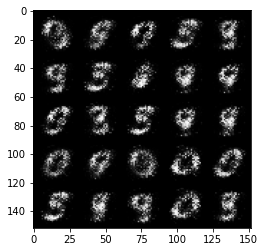

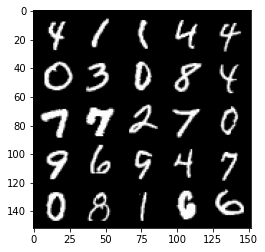

 66%|██████▌   | 308/469 [00:07<00:04, 39.49it/s]

Epoch 10, step 5000: Generator loss: 3.3205482835769686, discriminator loss: 0.0800814029499888


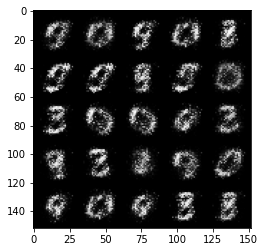

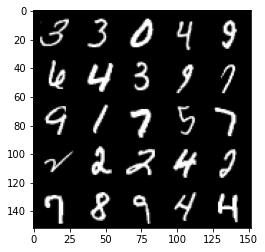

 73%|███████▎  | 341/469 [00:08<00:03, 39.57it/s]

Epoch 11, step 5500: Generator loss: 3.5596259002685513, discriminator loss: 0.06679886206984513


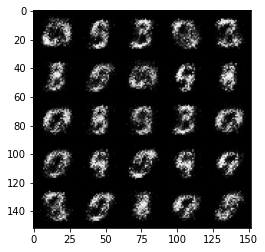

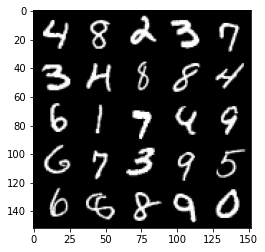

 79%|███████▊  | 369/469 [00:09<00:02, 39.51it/s]

Epoch 12, step 6000: Generator loss: 3.831918501853938, discriminator loss: 0.0658781213909388


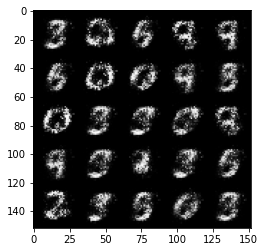

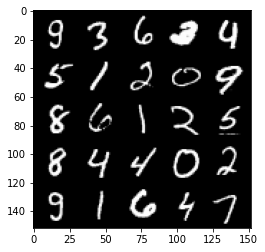

 86%|████████▌ | 401/469 [00:10<00:01, 39.48it/s]

Epoch 13, step 6500: Generator loss: 3.810689860343928, discriminator loss: 0.07659947037696843


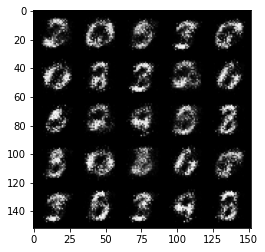

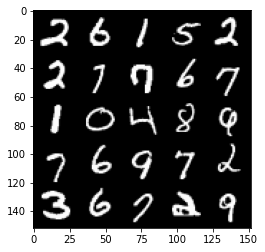

 92%|█████████▏| 432/469 [00:10<00:00, 39.39it/s]

Epoch 14, step 7000: Generator loss: 4.01571683931351, discriminator loss: 0.06045295615494249


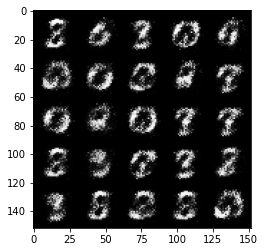

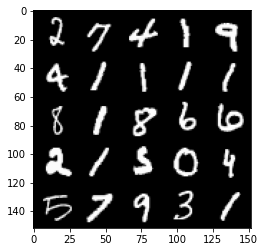

 99%|█████████▉| 464/469 [00:11<00:00, 39.51it/s]

Epoch 15, step 7500: Generator loss: 4.0588313283920305, discriminator loss: 0.05975252500548956


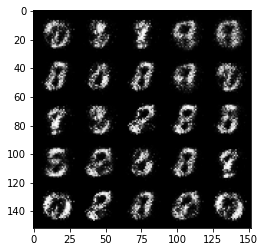

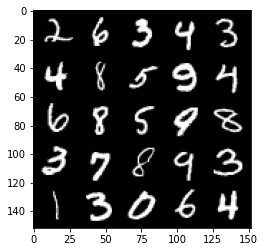

  5%|▌         | 24/469 [00:00<00:11, 39.30it/s]

Epoch 17, step 8000: Generator loss: 4.016577180862429, discriminator loss: 0.06531916591525078


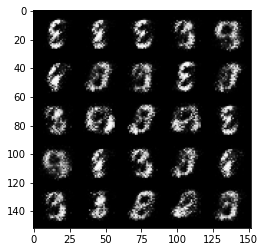

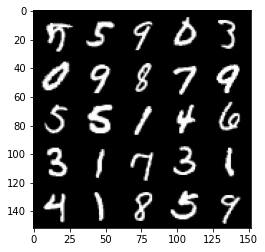

 12%|█▏        | 56/469 [00:01<00:10, 39.50it/s]

Epoch 18, step 8500: Generator loss: 4.228227327823643, discriminator loss: 0.054251211408525714


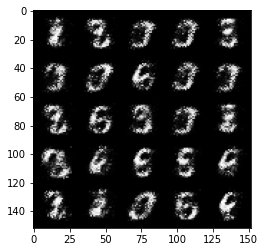

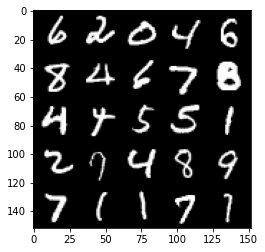

 19%|█▉        | 88/469 [00:02<00:09, 39.44it/s]

Epoch 19, step 9000: Generator loss: 4.241547146797179, discriminator loss: 0.055634377129375946


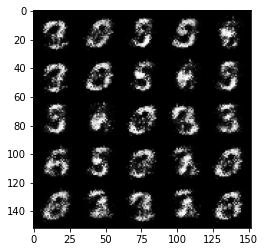

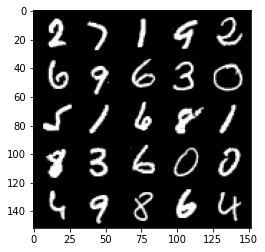

 26%|██▌       | 120/469 [00:03<00:08, 39.23it/s]

Epoch 20, step 9500: Generator loss: 4.129239602565768, discriminator loss: 0.059531236905604655


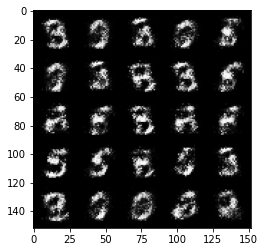

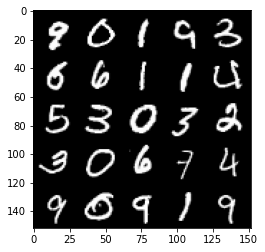

 32%|███▏      | 148/469 [00:03<00:08, 39.41it/s]

Epoch 21, step 10000: Generator loss: 4.178043978214266, discriminator loss: 0.06366124212741854


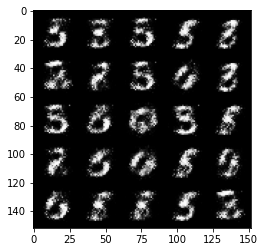

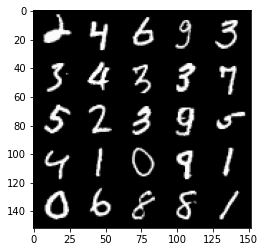

 39%|███▊      | 181/469 [00:04<00:07, 39.48it/s]

Epoch 22, step 10500: Generator loss: 4.2272420225143446, discriminator loss: 0.06991272722929712


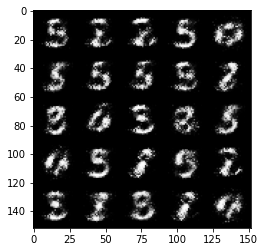

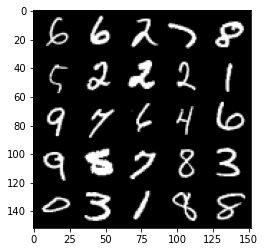

 45%|████▌     | 212/469 [00:05<00:06, 39.05it/s]

Epoch 23, step 11000: Generator loss: 4.423010273933416, discriminator loss: 0.06588936902210119


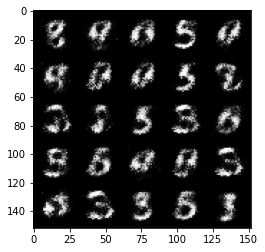

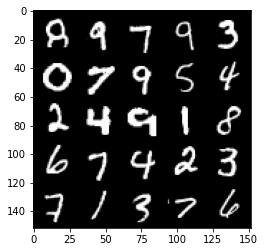

 52%|█████▏    | 244/469 [00:06<00:05, 39.54it/s]

Epoch 24, step 11500: Generator loss: 4.095877122402191, discriminator loss: 0.08002184495329853


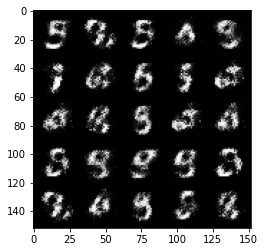

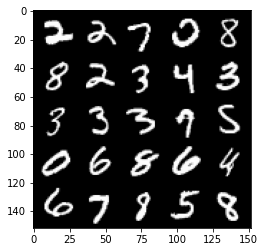

 58%|█████▊    | 272/469 [00:06<00:04, 39.49it/s]

Epoch 25, step 12000: Generator loss: 3.9869165682792636, discriminator loss: 0.09958522807806727


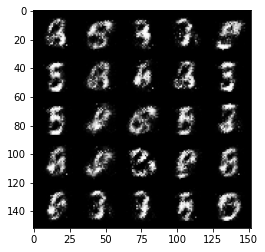

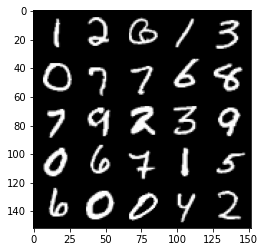

 65%|██████▍   | 304/469 [00:07<00:04, 39.27it/s]

Epoch 26, step 12500: Generator loss: 3.8107444477081303, discriminator loss: 0.1042616723850369


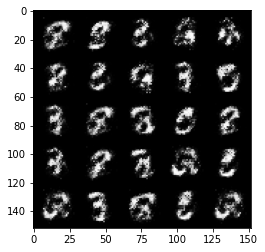

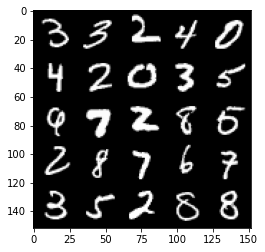

 72%|███████▏  | 336/469 [00:08<00:03, 39.47it/s]

Epoch 27, step 13000: Generator loss: 3.897206780910489, discriminator loss: 0.09453955782949919


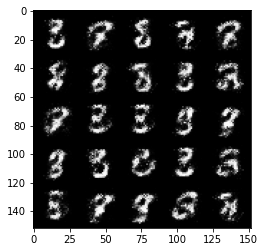

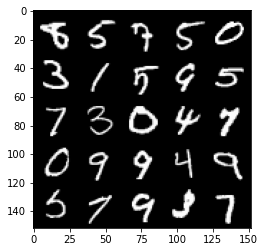

 78%|███████▊  | 365/469 [00:09<00:02, 39.43it/s]

Epoch 28, step 13500: Generator loss: 4.044365658283235, discriminator loss: 0.08811812527477741


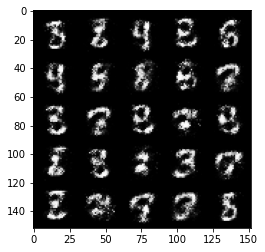

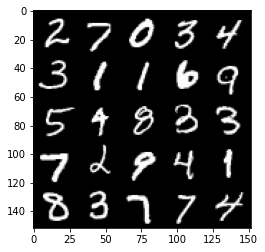

 85%|████████▍ | 397/469 [00:10<00:01, 39.45it/s]

Epoch 29, step 14000: Generator loss: 3.737640942096714, discriminator loss: 0.10721078696846956


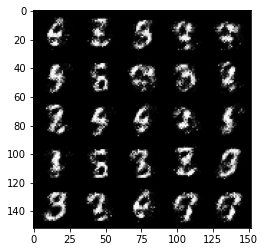

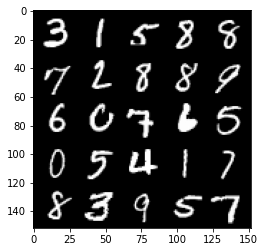

 91%|█████████▏| 428/469 [00:11<00:01, 39.29it/s]

Epoch 30, step 14500: Generator loss: 3.667548359870908, discriminator loss: 0.09981522485613836


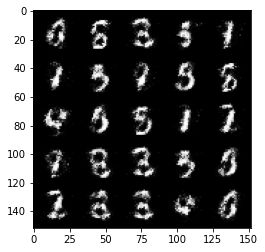

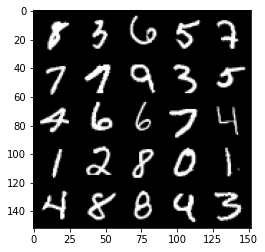

 98%|█████████▊| 460/469 [00:11<00:00, 39.44it/s]

Epoch 31, step 15000: Generator loss: 3.6323453822135923, discriminator loss: 0.13349657183885572


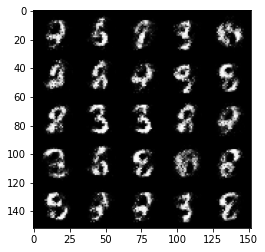

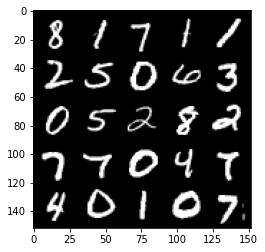

  4%|▍         | 20/469 [00:00<00:11, 39.25it/s]

Epoch 33, step 15500: Generator loss: 3.5034558677673338, discriminator loss: 0.13227049416303624


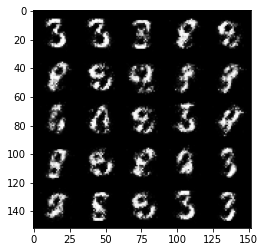

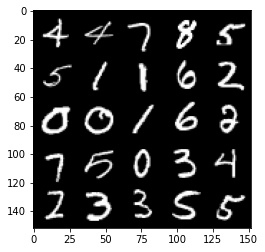

 11%|█         | 52/469 [00:01<00:10, 39.46it/s]

Epoch 34, step 16000: Generator loss: 3.4346953148841854, discriminator loss: 0.12242658157646646


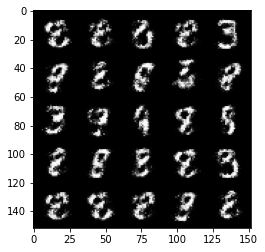

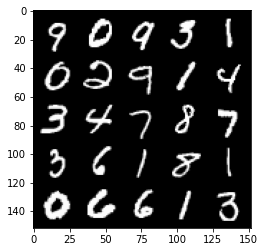

 18%|█▊        | 84/469 [00:02<00:09, 39.30it/s]

Epoch 35, step 16500: Generator loss: 3.7215219583511354, discriminator loss: 0.1104345915094019


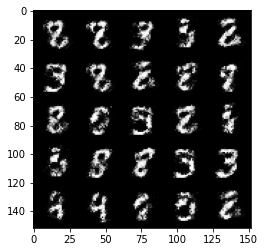

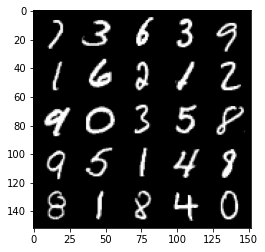

 25%|██▍       | 116/469 [00:02<00:08, 39.27it/s]

Epoch 36, step 17000: Generator loss: 3.5774546856880205, discriminator loss: 0.1349897679239512


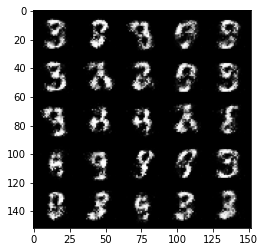

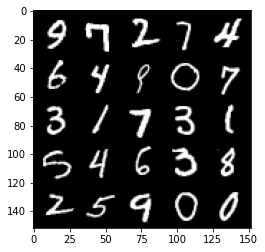

 31%|███       | 144/469 [00:03<00:08, 39.20it/s]

Epoch 37, step 17500: Generator loss: 3.5187330451011625, discriminator loss: 0.1293978279083967


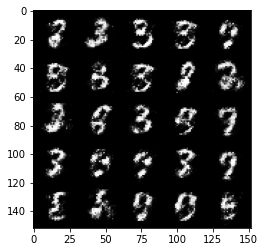

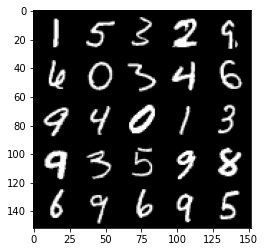

 38%|███▊      | 176/469 [00:04<00:07, 39.50it/s]

Epoch 38, step 18000: Generator loss: 3.3710927786827076, discriminator loss: 0.14120114259421826


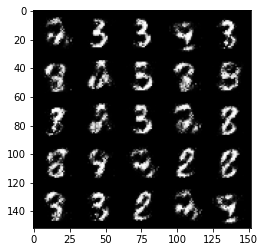

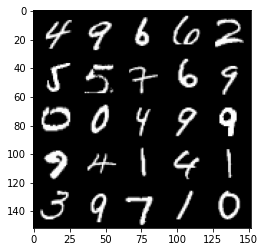

 45%|████▍     | 209/469 [00:05<00:06, 39.51it/s]

Epoch 39, step 18500: Generator loss: 3.386198192119597, discriminator loss: 0.14364088872075093


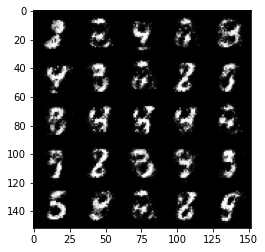

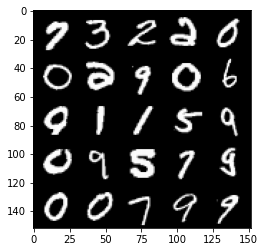

 51%|█████     | 240/469 [00:06<00:05, 39.28it/s]

Epoch 40, step 19000: Generator loss: 3.3389496026039143, discriminator loss: 0.1326275677531959


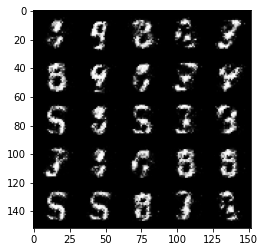

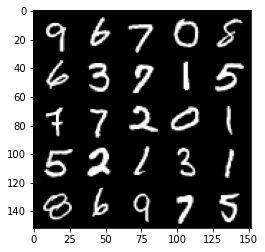

 57%|█████▋    | 268/469 [00:06<00:05, 39.48it/s]

Epoch 41, step 19500: Generator loss: 3.3477877769470217, discriminator loss: 0.1432098056226968


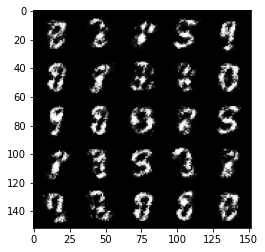

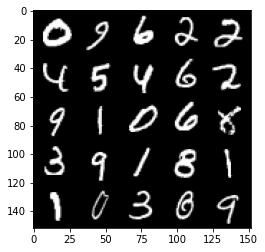

 64%|██████▍   | 300/469 [00:07<00:04, 39.52it/s]

Epoch 42, step 20000: Generator loss: 3.288858240127561, discriminator loss: 0.15084725444018832


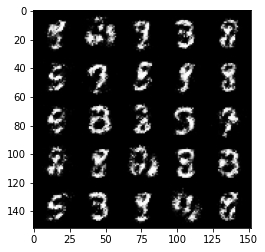

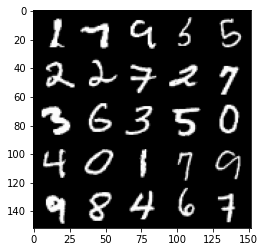

 71%|███████   | 332/469 [00:08<00:03, 39.47it/s]

Epoch 43, step 20500: Generator loss: 3.30221236228943, discriminator loss: 0.15612595787644395


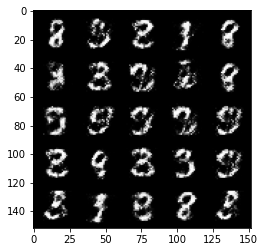

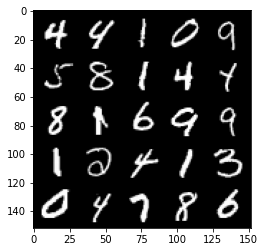

 78%|███████▊  | 364/469 [00:09<00:02, 39.42it/s]

Epoch 44, step 21000: Generator loss: 2.992215536117553, discriminator loss: 0.16537326356768603


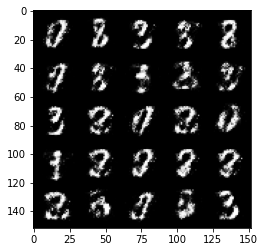

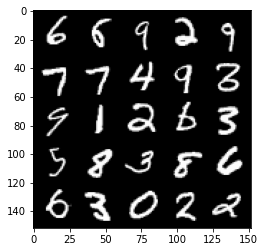

 84%|████████▎ | 392/469 [00:09<00:01, 39.43it/s]

Epoch 45, step 21500: Generator loss: 3.120689228057861, discriminator loss: 0.14092278613150128


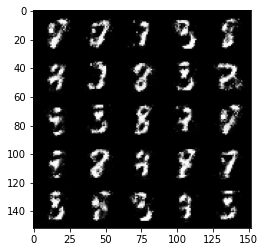

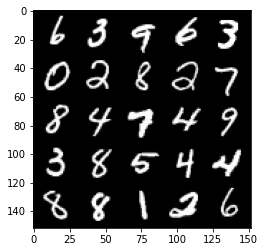

 90%|█████████ | 424/469 [00:10<00:01, 39.53it/s]

Epoch 46, step 22000: Generator loss: 3.1989005479812604, discriminator loss: 0.15785118663311004


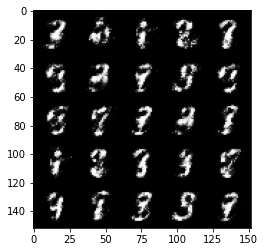

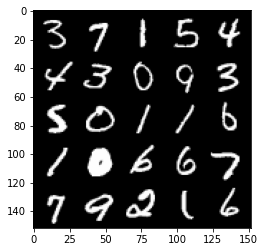

 97%|█████████▋| 456/469 [00:11<00:00, 39.39it/s]

Epoch 47, step 22500: Generator loss: 3.0310798764228797, discriminator loss: 0.1833582274764776


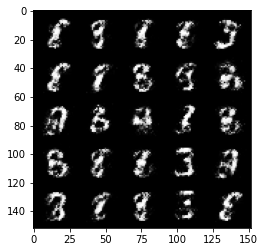

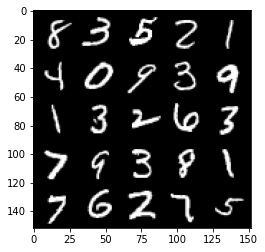

  3%|▎         | 16/469 [00:00<00:11, 39.10it/s]

Epoch 49, step 23000: Generator loss: 3.0766212868690515, discriminator loss: 0.1668065544366838


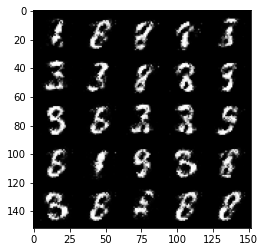

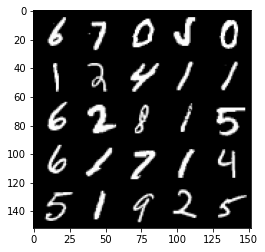

 10%|█         | 48/469 [00:01<00:10, 39.44it/s]

Epoch 50, step 23500: Generator loss: 3.1161158590316798, discriminator loss: 0.16413289222121238


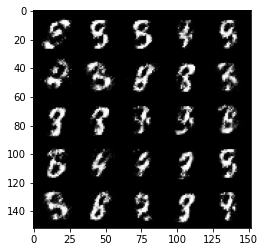

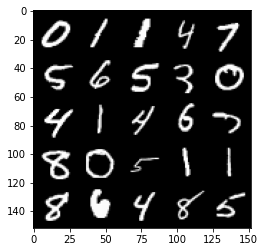

 17%|█▋        | 80/469 [00:02<00:09, 39.47it/s]

Epoch 51, step 24000: Generator loss: 2.9215865745544423, discriminator loss: 0.19615183241665385


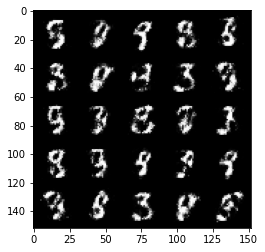

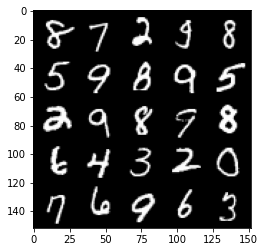

 24%|██▍       | 112/469 [00:02<00:09, 39.53it/s]

Epoch 52, step 24500: Generator loss: 3.043228463172911, discriminator loss: 0.17498261667788018


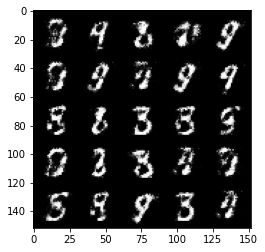

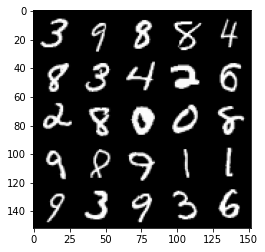

 30%|██▉       | 140/469 [00:03<00:08, 39.50it/s]

Epoch 53, step 25000: Generator loss: 2.9619988899230982, discriminator loss: 0.19090297900140277


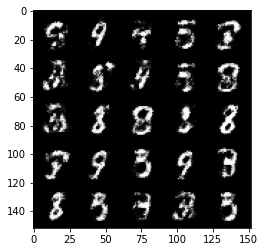

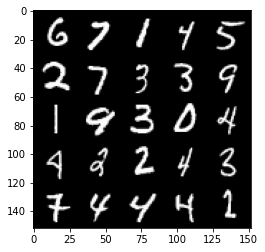

 37%|███▋      | 172/469 [00:04<00:07, 39.39it/s]

Epoch 54, step 25500: Generator loss: 2.7432300152778617, discriminator loss: 0.2154748373925687


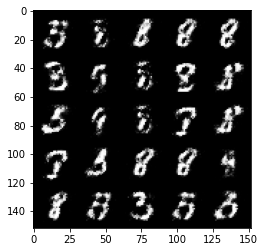

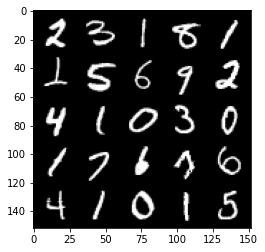

 43%|████▎     | 204/469 [00:05<00:06, 39.39it/s]

Epoch 55, step 26000: Generator loss: 2.8561582231521596, discriminator loss: 0.18470410972833634


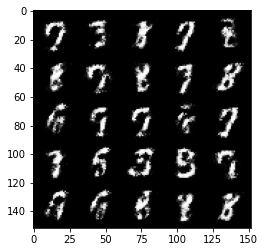

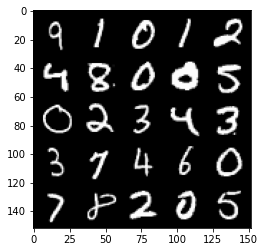

 50%|█████     | 236/469 [00:05<00:05, 39.43it/s]

Epoch 56, step 26500: Generator loss: 2.854861760139467, discriminator loss: 0.1947998916208744


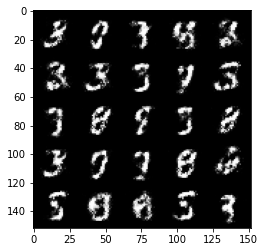

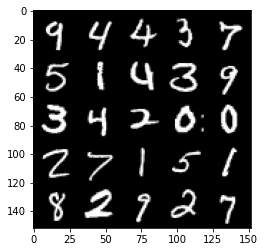

 56%|█████▋    | 264/469 [00:06<00:05, 39.38it/s]

Epoch 57, step 27000: Generator loss: 2.7853984007835404, discriminator loss: 0.19750361953675738


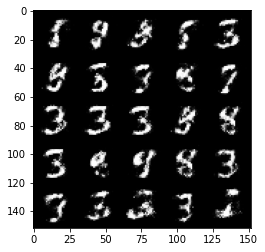

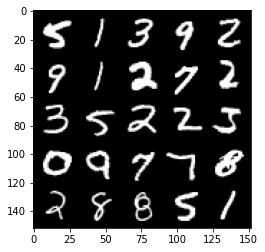

 63%|██████▎   | 296/469 [00:07<00:04, 39.48it/s]

Epoch 58, step 27500: Generator loss: 2.693251128196714, discriminator loss: 0.2098404977768661


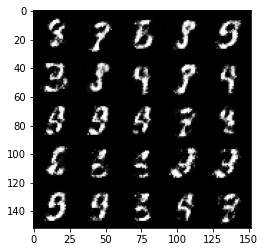

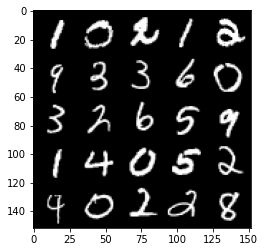

 70%|██████▉   | 328/469 [00:08<00:03, 39.51it/s]

Epoch 59, step 28000: Generator loss: 2.7907801032066333, discriminator loss: 0.2094137524962424


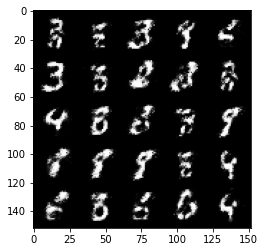

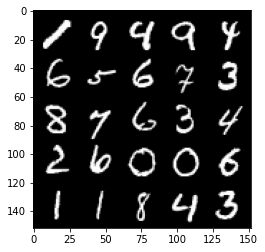

 77%|███████▋  | 360/469 [00:09<00:02, 39.45it/s]

Epoch 60, step 28500: Generator loss: 2.6872575006484984, discriminator loss: 0.21837356711924083


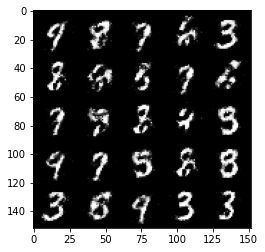

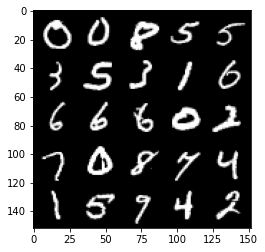

 83%|████████▎ | 388/469 [00:09<00:02, 39.44it/s]

Epoch 61, step 29000: Generator loss: 2.7541721343994117, discriminator loss: 0.20618763370811932


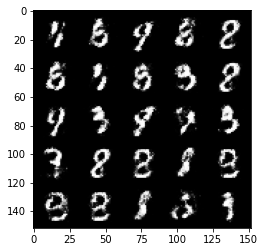

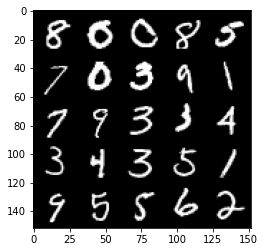

 90%|████████▉ | 420/469 [00:10<00:01, 39.46it/s]

Epoch 62, step 29500: Generator loss: 2.6190782184600834, discriminator loss: 0.230140850096941


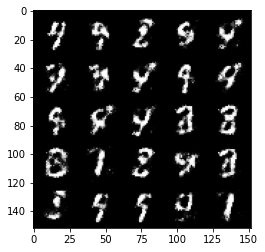

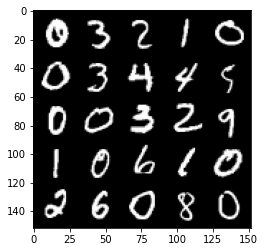

 96%|█████████▋| 452/469 [00:11<00:00, 39.47it/s]

Epoch 63, step 30000: Generator loss: 2.617243152141572, discriminator loss: 0.22104980906844152


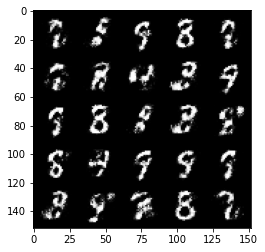

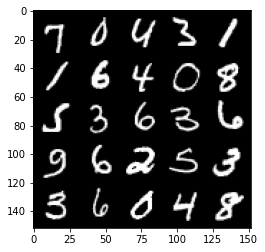

  3%|▎         | 12/469 [00:00<00:11, 39.21it/s]

Epoch 65, step 30500: Generator loss: 2.6681827912330665, discriminator loss: 0.2227674509286882


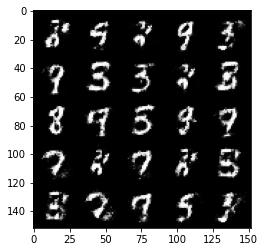

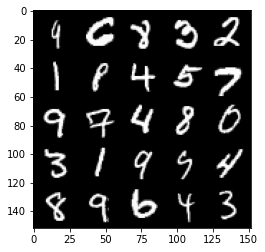

  9%|▉         | 44/469 [00:01<00:10, 39.51it/s]

Epoch 66, step 31000: Generator loss: 2.6576209607124355, discriminator loss: 0.22206558826565737


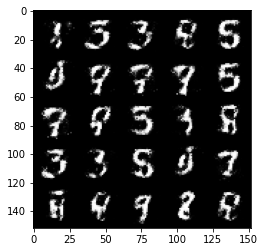

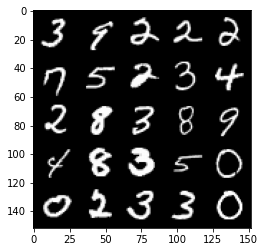

 16%|█▋        | 77/469 [00:01<00:10, 38.98it/s]

Epoch 67, step 31500: Generator loss: 2.5572186379432638, discriminator loss: 0.2351928272247315


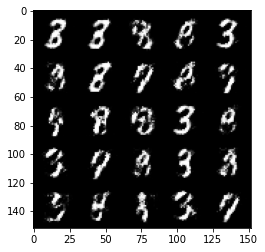

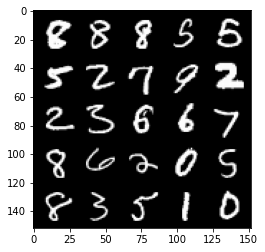

 23%|██▎       | 108/469 [00:02<00:09, 39.41it/s]

Epoch 68, step 32000: Generator loss: 2.4450335838794723, discriminator loss: 0.24761813774704924


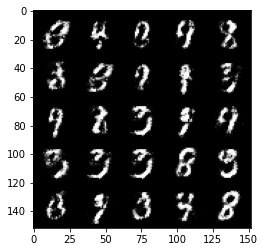

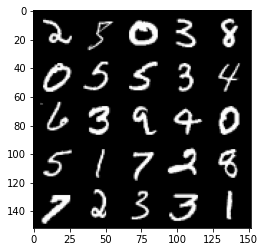

 29%|██▉       | 136/469 [00:03<00:08, 39.52it/s]

Epoch 69, step 32500: Generator loss: 2.514190313339231, discriminator loss: 0.24296859437227236


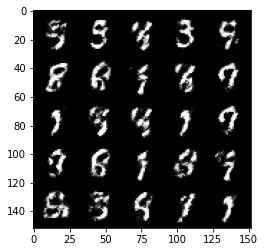

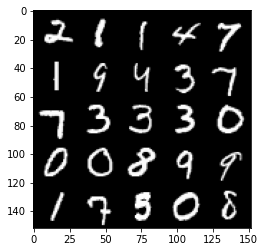

 36%|███▌      | 168/469 [00:04<00:07, 39.52it/s]

Epoch 70, step 33000: Generator loss: 2.424467169284819, discriminator loss: 0.25634828308224666


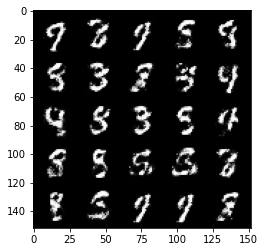

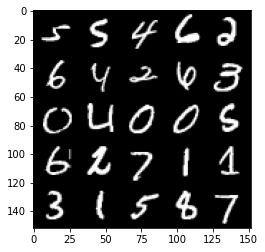

 43%|████▎     | 200/469 [00:05<00:06, 39.05it/s]

Epoch 71, step 33500: Generator loss: 2.566942017078399, discriminator loss: 0.23365672311186778


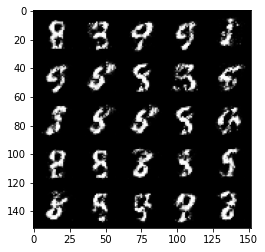

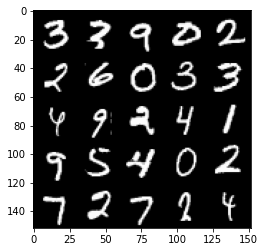

 49%|████▉     | 232/469 [00:05<00:06, 39.38it/s]

Epoch 72, step 34000: Generator loss: 2.5671961920261377, discriminator loss: 0.2438252443373202


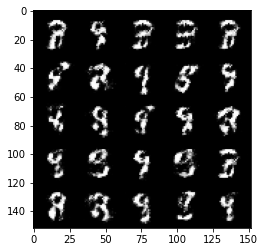

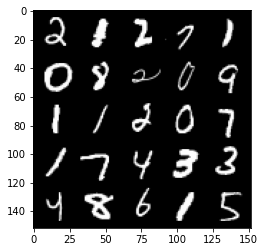

 55%|█████▌    | 260/469 [00:06<00:05, 39.46it/s]

Epoch 73, step 34500: Generator loss: 2.4143422908782983, discriminator loss: 0.2634504424035549


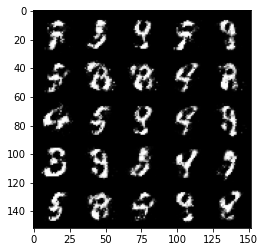

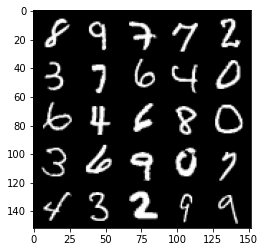

 62%|██████▏   | 292/469 [00:07<00:04, 39.40it/s]

Epoch 74, step 35000: Generator loss: 2.517634518623351, discriminator loss: 0.24813855880498892


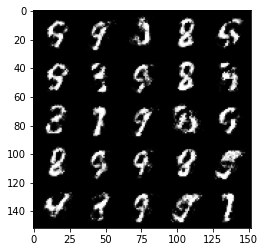

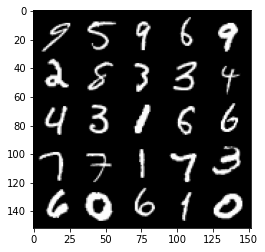

 69%|██████▉   | 324/469 [00:08<00:03, 39.38it/s]

Epoch 75, step 35500: Generator loss: 2.469953662872315, discriminator loss: 0.2501392649114132


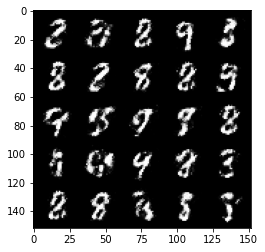

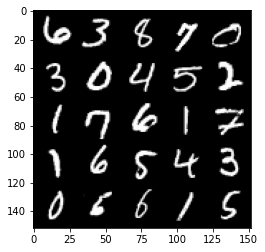

 76%|███████▌  | 356/469 [00:09<00:02, 39.51it/s]

Epoch 76, step 36000: Generator loss: 2.4341350102424615, discriminator loss: 0.25508807149529455


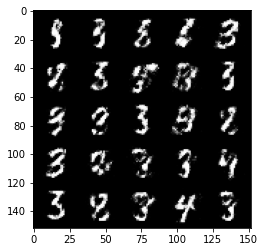

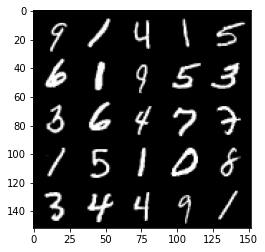

 82%|████████▏ | 384/469 [00:09<00:02, 39.29it/s]

Epoch 77, step 36500: Generator loss: 2.4008679351806643, discriminator loss: 0.2608520264327529


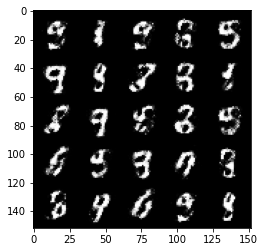

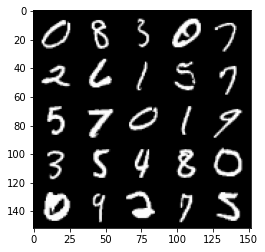

 89%|████████▊ | 416/469 [00:10<00:01, 39.43it/s]

Epoch 78, step 37000: Generator loss: 2.4396475820541386, discriminator loss: 0.2569277493655684


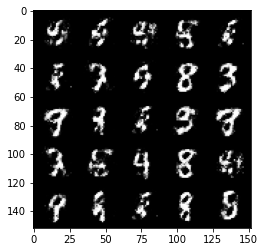

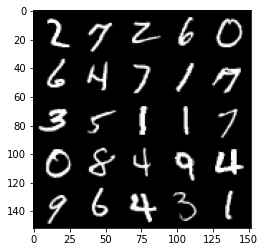

 96%|█████████▌| 448/469 [00:11<00:00, 39.40it/s]

Epoch 79, step 37500: Generator loss: 2.3918024644851688, discriminator loss: 0.2621119214892386


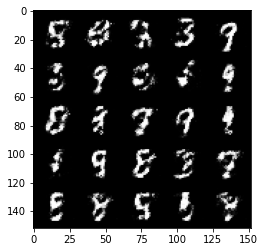

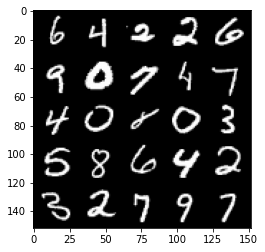

  2%|▏         | 8/469 [00:00<00:11, 38.77it/s]

Epoch 81, step 38000: Generator loss: 2.214922607660293, discriminator loss: 0.28885495600104344


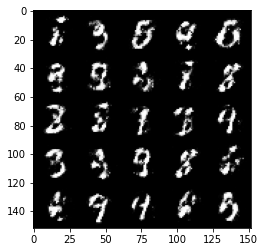

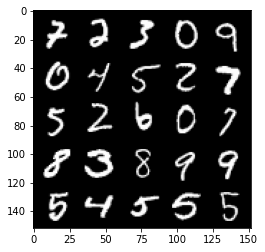

  9%|▊         | 40/469 [00:01<00:10, 39.48it/s]

Epoch 82, step 38500: Generator loss: 2.1876754026412963, discriminator loss: 0.2869742527902127


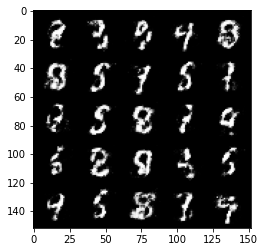

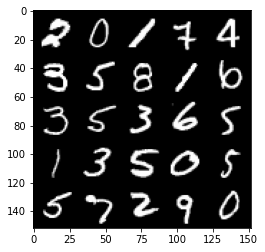

 15%|█▌        | 72/469 [00:01<00:10, 39.52it/s]

Epoch 83, step 39000: Generator loss: 2.3151347951889027, discriminator loss: 0.2631142411828042


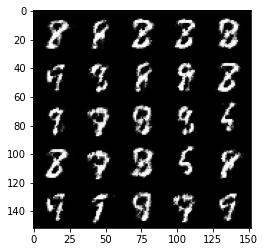

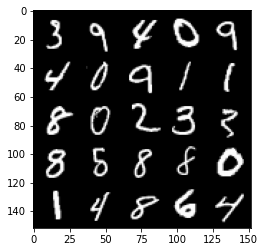

 22%|██▏       | 104/469 [00:02<00:09, 39.45it/s]

Epoch 84, step 39500: Generator loss: 2.182302012681959, discriminator loss: 0.2994355189502238


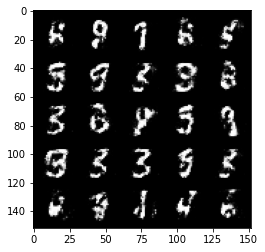

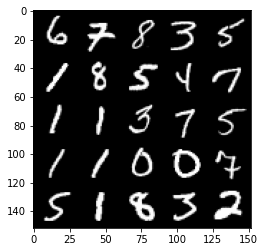

 28%|██▊       | 132/469 [00:03<00:08, 39.51it/s]

Epoch 85, step 40000: Generator loss: 2.143016952991484, discriminator loss: 0.31246953362226476


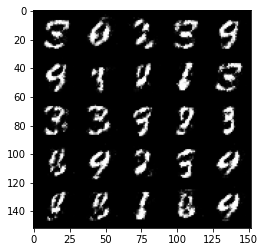

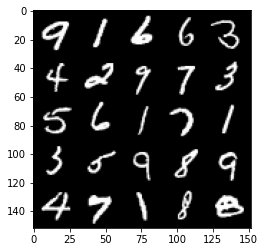

 35%|███▌      | 165/469 [00:04<00:07, 39.46it/s]

Epoch 86, step 40500: Generator loss: 2.1362905220985415, discriminator loss: 0.30350213995575925


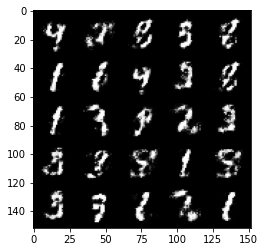

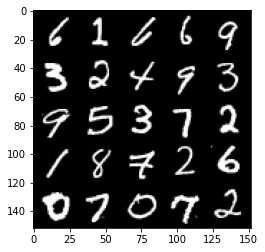

 42%|████▏     | 196/469 [00:04<00:06, 39.50it/s]

Epoch 87, step 41000: Generator loss: 2.1904286196231832, discriminator loss: 0.2972611047327518


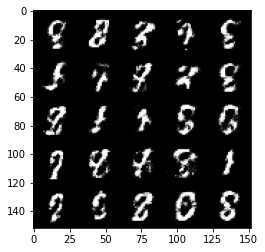

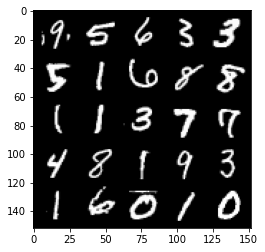

 49%|████▊     | 228/469 [00:05<00:06, 39.50it/s]

Epoch 88, step 41500: Generator loss: 2.140102767467498, discriminator loss: 0.3043529358506204


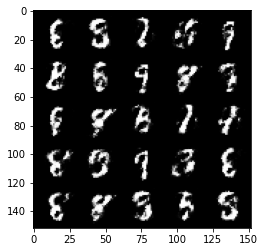

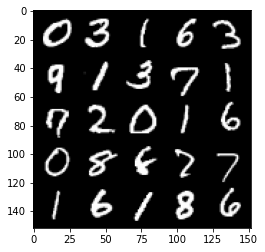

 55%|█████▍    | 256/469 [00:06<00:05, 39.45it/s]

Epoch 89, step 42000: Generator loss: 2.2218828535079957, discriminator loss: 0.27869803375005753


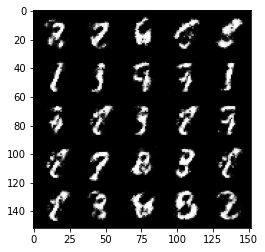

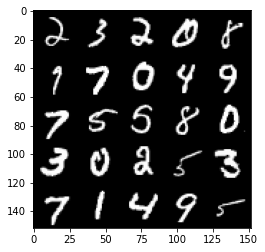

 61%|██████▏   | 288/469 [00:07<00:04, 39.40it/s]

Epoch 90, step 42500: Generator loss: 2.201488757848738, discriminator loss: 0.2929733515977859


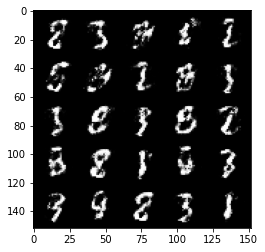

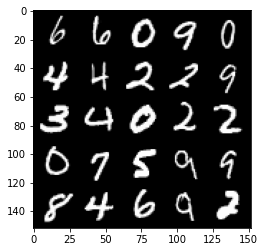

 68%|██████▊   | 320/469 [00:08<00:03, 39.54it/s]

Epoch 91, step 43000: Generator loss: 2.253837700366975, discriminator loss: 0.27906614348292336


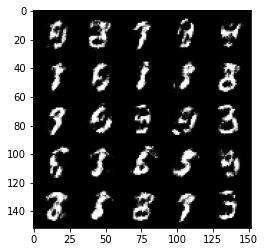

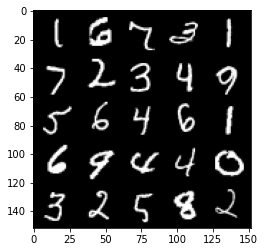

 75%|███████▌  | 352/469 [00:08<00:02, 39.40it/s]

Epoch 92, step 43500: Generator loss: 2.179429893970492, discriminator loss: 0.29265615704655684


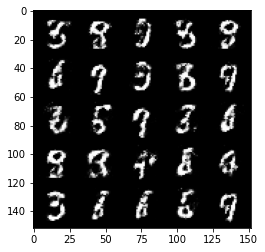

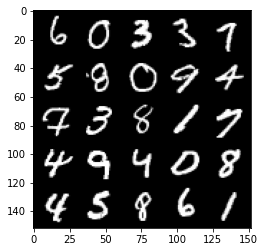

 81%|████████  | 380/469 [00:09<00:02, 39.50it/s]

Epoch 93, step 44000: Generator loss: 2.02775658917427, discriminator loss: 0.3191605392396445


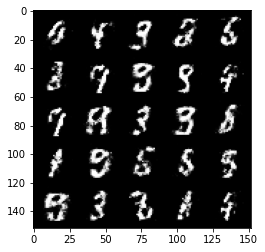

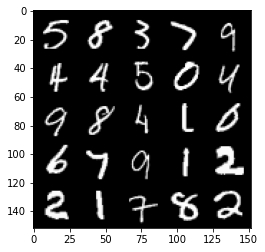

 88%|████████▊ | 412/469 [00:10<00:01, 39.40it/s]

Epoch 94, step 44500: Generator loss: 1.9817231845855732, discriminator loss: 0.3317946268022059


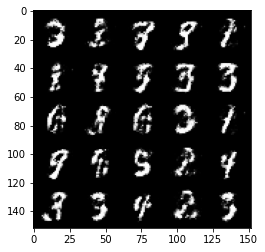

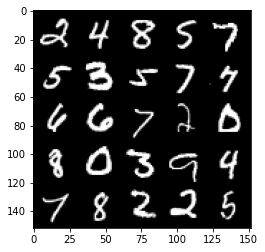

 95%|█████████▍| 444/469 [00:11<00:00, 37.43it/s]

Epoch 95, step 45000: Generator loss: 2.0069523665904985, discriminator loss: 0.32777321892976813


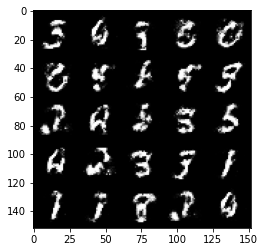

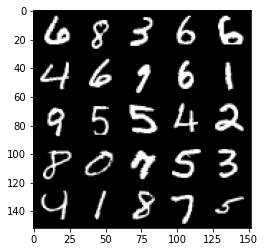

  1%|          | 4/469 [00:00<00:12, 38.71it/s]

Epoch 97, step 45500: Generator loss: 1.93739071059227, discriminator loss: 0.33539925193786624


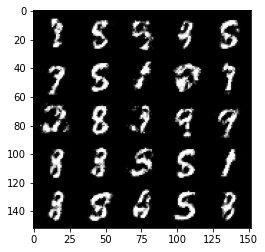

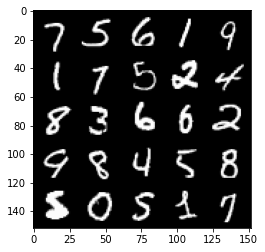

  8%|▊         | 36/469 [00:00<00:11, 39.10it/s]

Epoch 98, step 46000: Generator loss: 1.9692231762409218, discriminator loss: 0.3251982213258744


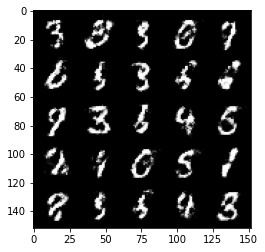

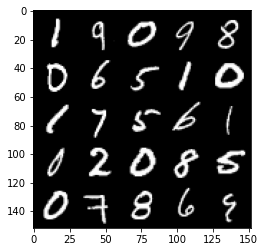

 14%|█▍        | 68/469 [00:01<00:10, 39.34it/s]

Epoch 99, step 46500: Generator loss: 1.9316900558471681, discriminator loss: 0.3468334847390653


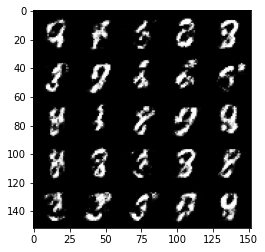

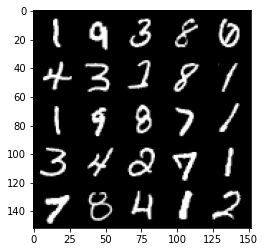

 21%|██▏       | 100/469 [00:02<00:09, 39.47it/s]

Epoch 100, step 47000: Generator loss: 1.9476626110076904, discriminator loss: 0.33678212267160457


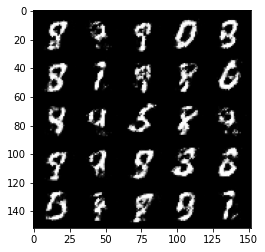

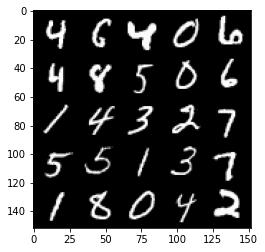

 27%|██▋       | 128/469 [00:03<00:08, 39.48it/s]

Epoch 101, step 47500: Generator loss: 1.8401554279327375, discriminator loss: 0.3569362476468086


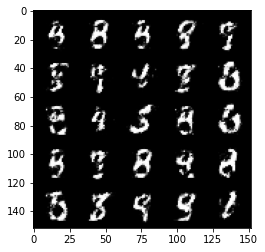

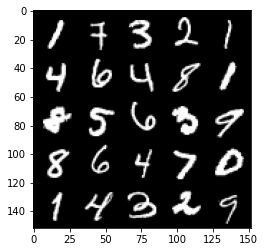

 34%|███▍      | 160/469 [00:04<00:08, 36.49it/s]

Epoch 102, step 48000: Generator loss: 1.9239278049468989, discriminator loss: 0.33008694332838057


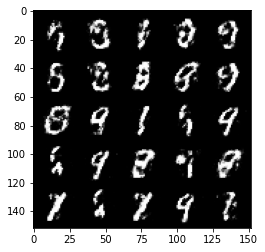

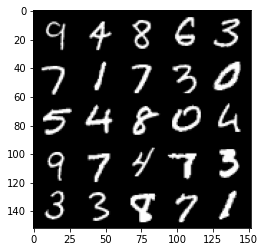

 41%|████      | 192/469 [00:05<00:07, 37.01it/s]

Epoch 103, step 48500: Generator loss: 1.9306876473426795, discriminator loss: 0.34130258095264465


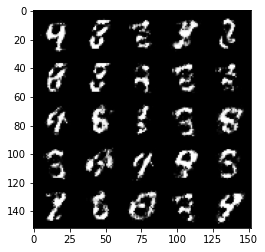

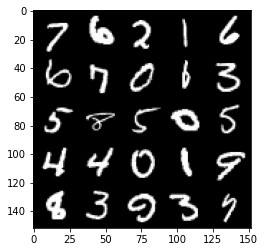

 48%|████▊     | 224/469 [00:05<00:06, 38.52it/s]

Epoch 104, step 49000: Generator loss: 2.0184803977012633, discriminator loss: 0.3114740257263185


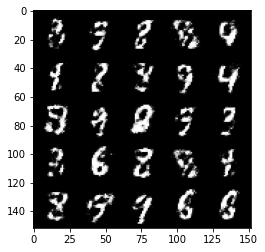

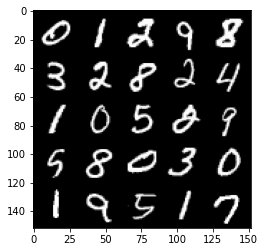

 54%|█████▎    | 252/469 [00:06<00:05, 37.03it/s]

Epoch 105, step 49500: Generator loss: 1.9584558568000798, discriminator loss: 0.35101046290993654


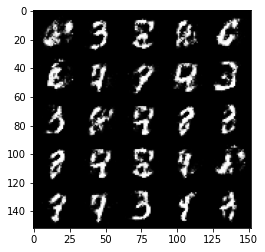

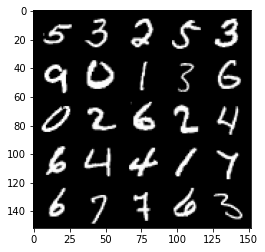

 61%|██████    | 284/469 [00:07<00:04, 37.37it/s]

Epoch 106, step 50000: Generator loss: 1.8635144872665421, discriminator loss: 0.35051455354690586


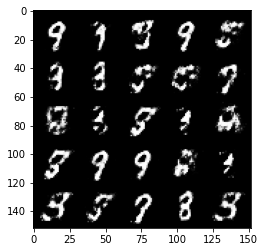

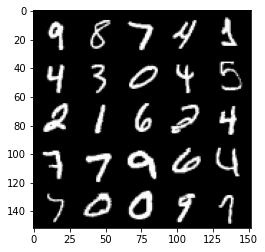

 67%|██████▋   | 316/469 [00:08<00:04, 37.40it/s]

Epoch 107, step 50500: Generator loss: 1.9105874638557447, discriminator loss: 0.3342711697816851


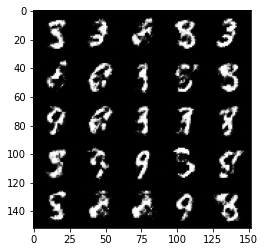

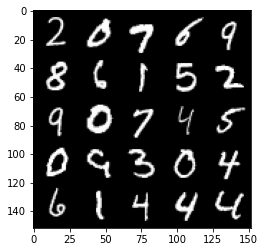

 74%|███████▍  | 348/469 [00:09<00:03, 37.85it/s]

Epoch 108, step 51000: Generator loss: 1.918057860136032, discriminator loss: 0.34884185892343533


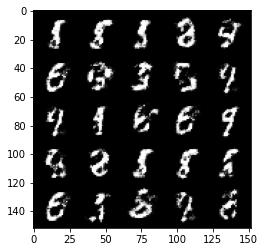

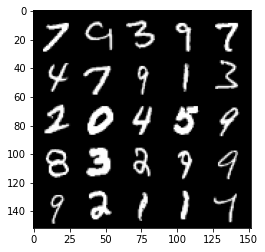

 80%|████████  | 376/469 [00:10<00:02, 37.00it/s]

Epoch 109, step 51500: Generator loss: 1.9279114122390735, discriminator loss: 0.3406615523397922


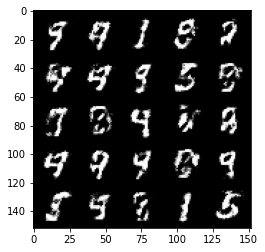

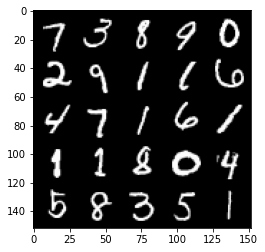

 87%|████████▋ | 408/469 [00:10<00:01, 37.79it/s]

Epoch 110, step 52000: Generator loss: 1.9204119694232948, discriminator loss: 0.34159780097007775


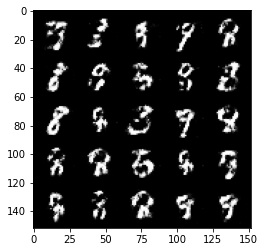

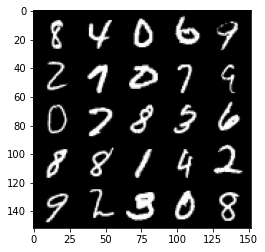

 94%|█████████▍| 440/469 [00:11<00:00, 37.69it/s]

Epoch 111, step 52500: Generator loss: 1.9594890673160552, discriminator loss: 0.32448029917478566


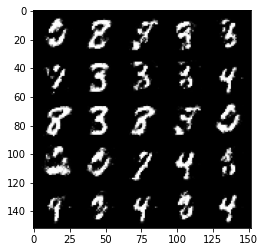

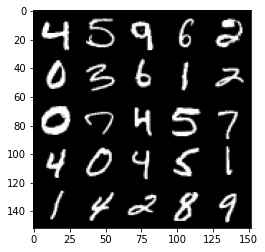

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 113, step 53000: Generator loss: 1.9359784228801746, discriminator loss: 0.3416975828111173


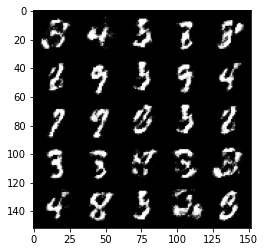

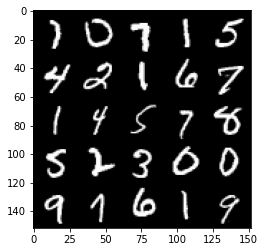

  7%|▋         | 32/469 [00:00<00:11, 36.60it/s]

Epoch 114, step 53500: Generator loss: 1.8277448675632486, discriminator loss: 0.3526395714282988


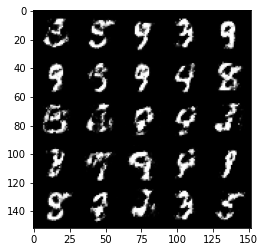

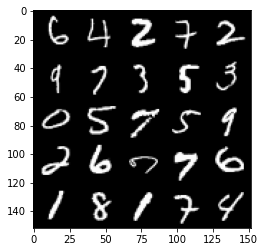

 14%|█▎        | 64/469 [00:01<00:10, 37.45it/s]

Epoch 115, step 54000: Generator loss: 1.8675048198699948, discriminator loss: 0.33735152044892336


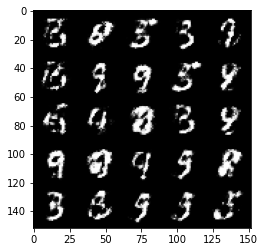

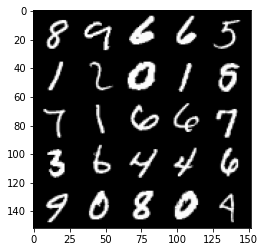

 20%|██        | 96/469 [00:02<00:10, 37.22it/s]

Epoch 116, step 54500: Generator loss: 1.8204223020076764, discriminator loss: 0.35084478110074974


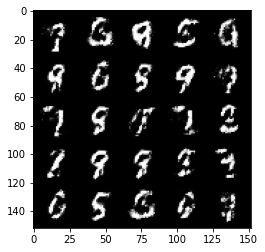

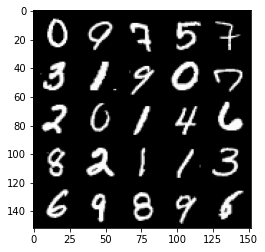

 26%|██▋       | 124/469 [00:03<00:09, 37.04it/s]

Epoch 117, step 55000: Generator loss: 1.7849461822509771, discriminator loss: 0.3567280980944636


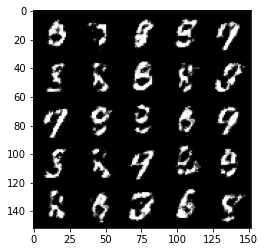

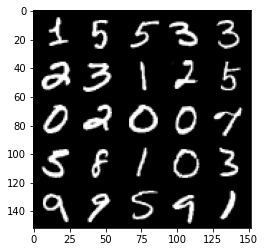

 33%|███▎      | 156/469 [00:04<00:08, 37.07it/s]

Epoch 118, step 55500: Generator loss: 1.7359645252227796, discriminator loss: 0.3602373992800715


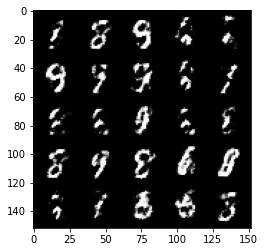

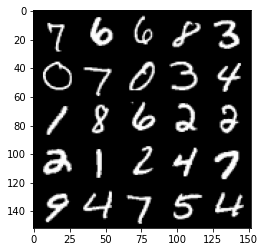

 40%|████      | 188/469 [00:05<00:07, 36.65it/s]

Epoch 119, step 56000: Generator loss: 1.7232442657947555, discriminator loss: 0.3744279072284696


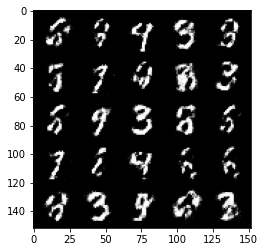

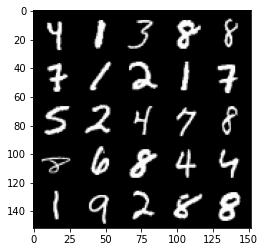

 47%|████▋     | 220/469 [00:05<00:06, 39.20it/s]

Epoch 120, step 56500: Generator loss: 1.663598281860352, discriminator loss: 0.37922339695692064


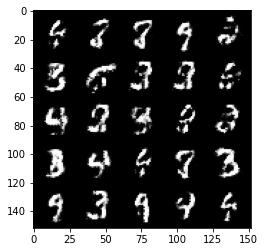

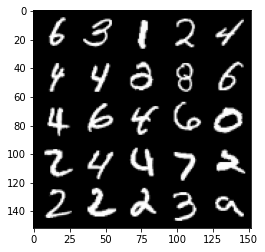

 53%|█████▎    | 248/469 [00:06<00:05, 37.26it/s]

Epoch 121, step 57000: Generator loss: 1.7621159965991975, discriminator loss: 0.36497993439435955


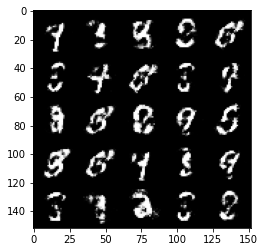

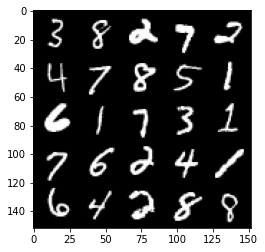

 60%|█████▉    | 280/469 [00:07<00:05, 37.15it/s]

Epoch 122, step 57500: Generator loss: 1.7623129515647864, discriminator loss: 0.369278687119484


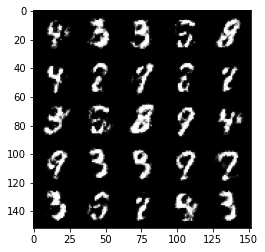

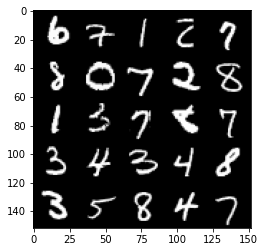

 67%|██████▋   | 312/469 [00:08<00:04, 37.00it/s]

Epoch 123, step 58000: Generator loss: 1.6735315618515025, discriminator loss: 0.3925073654651644


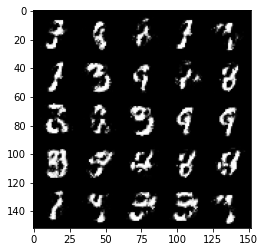

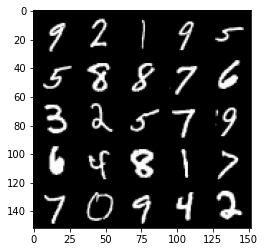

 73%|███████▎  | 344/469 [00:09<00:03, 39.44it/s]

Epoch 124, step 58500: Generator loss: 1.783614779472351, discriminator loss: 0.3633278706669812


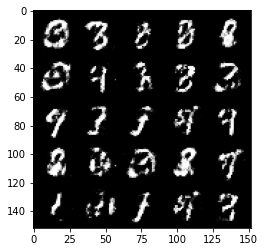

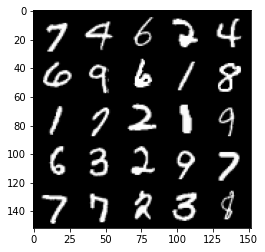

 79%|███████▉  | 372/469 [00:09<00:02, 37.84it/s]

Epoch 125, step 59000: Generator loss: 1.673372469186784, discriminator loss: 0.3985261875391007


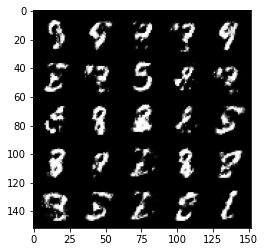

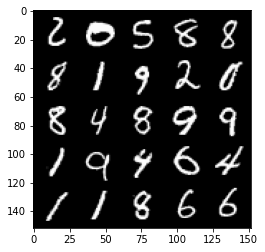

 86%|████████▌ | 404/469 [00:10<00:01, 36.98it/s]

Epoch 126, step 59500: Generator loss: 1.629964936733245, discriminator loss: 0.3995543606877329


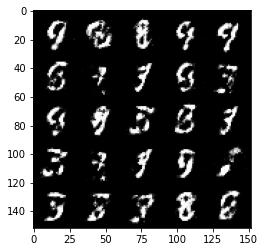

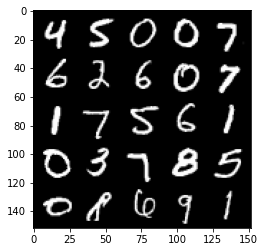

 93%|█████████▎| 436/469 [00:11<00:00, 37.12it/s]

Epoch 127, step 60000: Generator loss: 1.683457954883576, discriminator loss: 0.3777200467586516


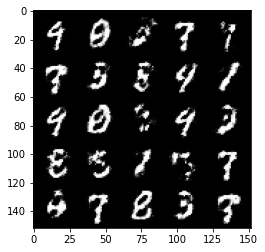

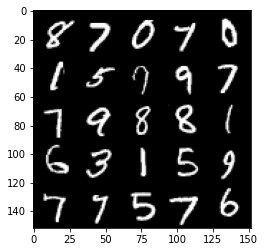

100%|█████████▉| 468/469 [00:12<00:00, 36.72it/s]

Epoch 128, step 60500: Generator loss: 1.822397174358369, discriminator loss: 0.34506382340192826


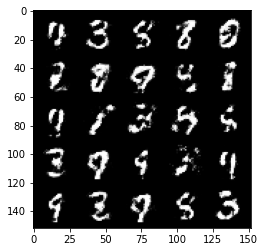

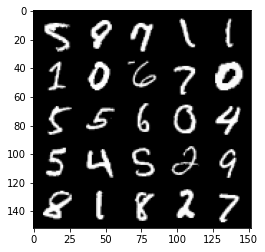

  6%|▌         | 28/469 [00:00<00:11, 38.96it/s]

Epoch 130, step 61000: Generator loss: 1.738708122491839, discriminator loss: 0.37231976372003567


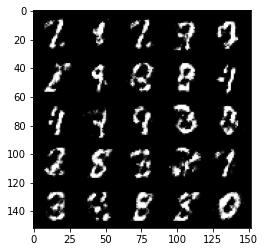

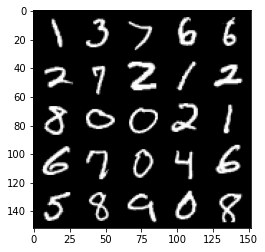

 13%|█▎        | 60/469 [00:01<00:10, 39.13it/s]

Epoch 131, step 61500: Generator loss: 1.7174662647247314, discriminator loss: 0.3771654810309415


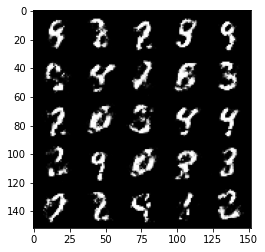

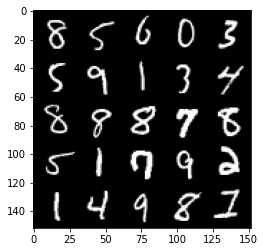

 20%|█▉        | 92/469 [00:02<00:09, 37.90it/s]

Epoch 132, step 62000: Generator loss: 1.6890825161933896, discriminator loss: 0.3887249481081962


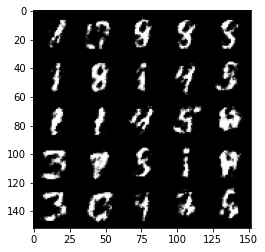

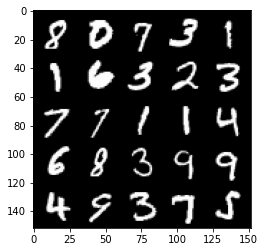

 26%|██▌       | 120/469 [00:03<00:09, 36.83it/s]

Epoch 133, step 62500: Generator loss: 1.728308861017227, discriminator loss: 0.3659483759403227


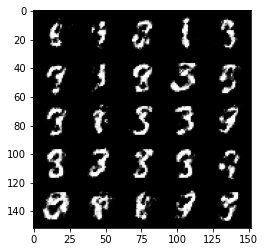

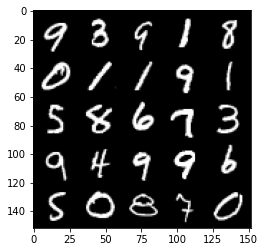

 32%|███▏      | 152/469 [00:04<00:08, 37.02it/s]

Epoch 134, step 63000: Generator loss: 1.6665831639766686, discriminator loss: 0.3866223546266553


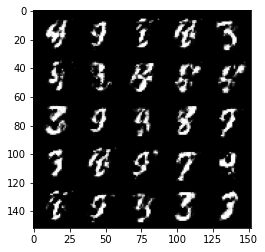

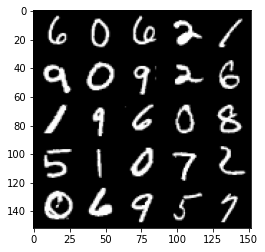

 39%|███▉      | 184/469 [00:04<00:07, 39.36it/s]

Epoch 135, step 63500: Generator loss: 1.8341566252708421, discriminator loss: 0.34487217536568643


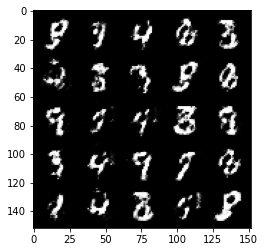

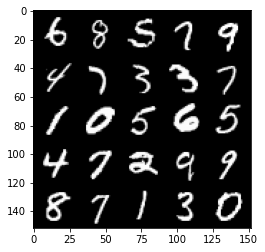

 46%|████▌     | 216/469 [00:05<00:06, 39.14it/s]

Epoch 136, step 64000: Generator loss: 1.6965028777122504, discriminator loss: 0.3850190796852116


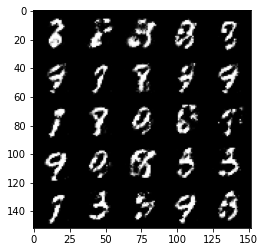

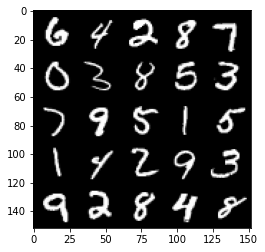

 52%|█████▏    | 244/469 [00:06<00:06, 37.08it/s]

Epoch 137, step 64500: Generator loss: 1.6871936824321738, discriminator loss: 0.3816210222840314


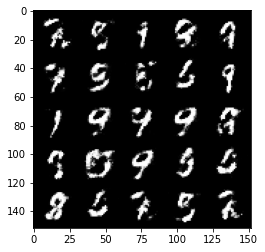

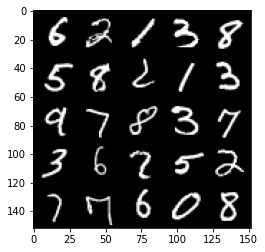

 59%|█████▉    | 276/469 [00:07<00:05, 37.00it/s]

Epoch 138, step 65000: Generator loss: 1.6762053241729753, discriminator loss: 0.3792323848605157


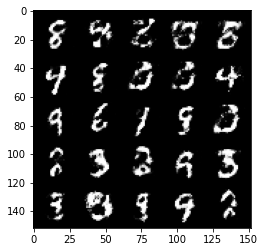

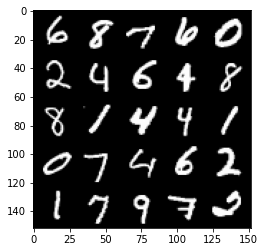

 66%|██████▌   | 308/469 [00:08<00:04, 37.63it/s]

Epoch 139, step 65500: Generator loss: 1.6339168534278874, discriminator loss: 0.39884563654661176


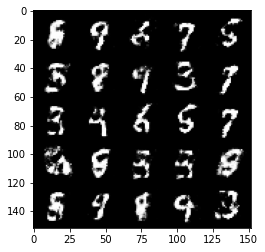

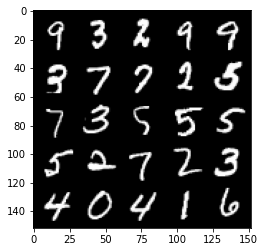

 72%|███████▏  | 340/469 [00:09<00:03, 36.97it/s]

Epoch 140, step 66000: Generator loss: 1.6068262064456946, discriminator loss: 0.40600757008790955


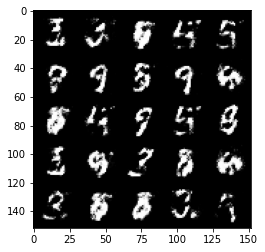

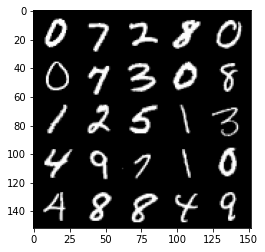

 78%|███████▊  | 368/469 [00:09<00:02, 37.17it/s]

Epoch 141, step 66500: Generator loss: 1.590934979200363, discriminator loss: 0.4145044414997099


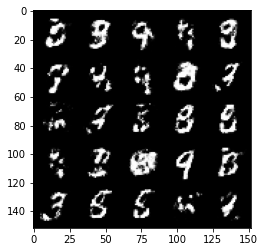

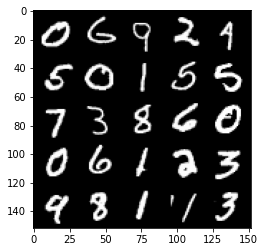

 85%|████████▌ | 400/469 [00:10<00:01, 37.07it/s]

Epoch 142, step 67000: Generator loss: 1.6087763314247125, discriminator loss: 0.39819806373119343


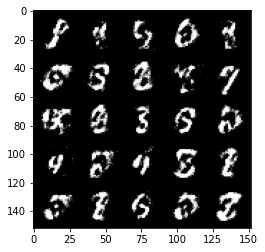

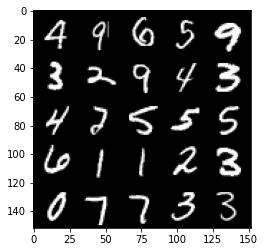

 92%|█████████▏| 432/469 [00:11<00:00, 37.71it/s]

Epoch 143, step 67500: Generator loss: 1.6495182604789747, discriminator loss: 0.3992750176787377


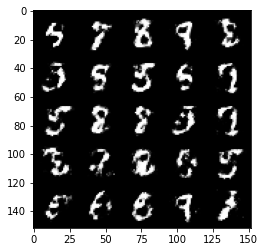

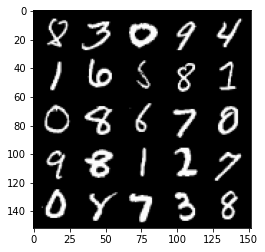

 99%|█████████▉| 464/469 [00:12<00:00, 38.72it/s]

Epoch 144, step 68000: Generator loss: 1.5813698089122774, discriminator loss: 0.3996709415316584


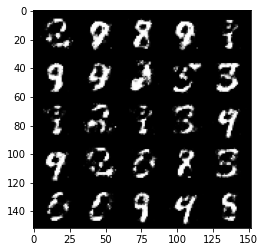

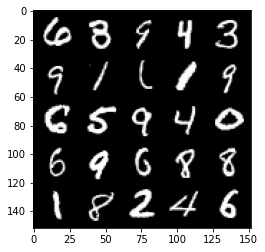

 78%|███████▊  | 364/469 [00:09<00:02, 39.43it/s]

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        
        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1